In [1]:
pip install 'torchsummary'

Note: you may need to restart the kernel to use updated packages.


In [2]:
import warnings
warnings.filterwarnings('ignore')

import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from PIL import Image
%matplotlib inline

# tweaks for libraries
np.set_printoptions(precision=6, linewidth=1024, suppress=True)
plt.style.use('seaborn')
sns.set(style='darkgrid', context='notebook',font_scale=1.10)

# Pytorch
import torch
gpu_available = torch.cuda.is_available()
print('Using Pytorch version %s. GPU %s available' % (torch.__version__, "IS" if gpu_available else "IS **NOT**"))
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch import optim
from torch.utils.data.dataset import Dataset
from torchsummary import summary

# to ensure that you get consistent results
# @see: https://discuss.pytorch.org/t/reproducibility-over-different-machines/63047
seed = 123
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed);

if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.enabled = False

Using Pytorch version 2.4.0. GPU IS available


In [3]:
DATA_FOLDER = '/kaggle/input/histopathologic-cancer-detection/'
df = pd.read_csv(DATA_FOLDER + 'train_labels.csv')
df.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


In [4]:
len(df[df.isnull().any(axis=1)])

0

<Axes: xlabel='label'>

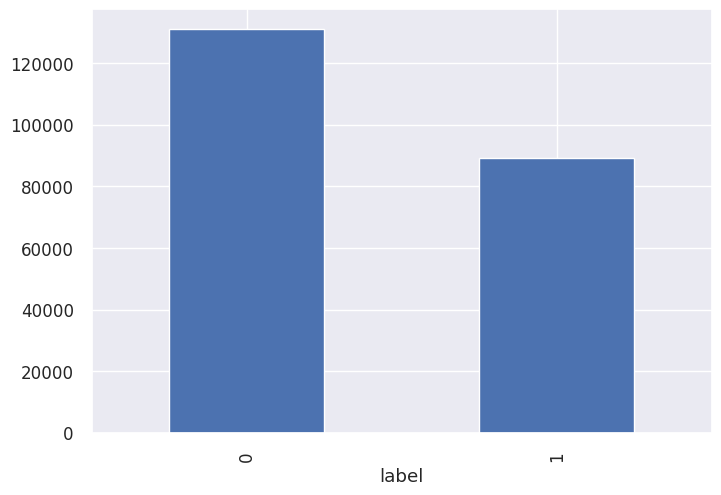

In [5]:
# Let's check the distribution of target labels
df['label'].value_counts().plot(kind='bar')

In [6]:
# Let's save the benign & malignant counts
# which help us weight balance the loss function
num_benign, num_malignant = np.bincount(df['label'])
print(f"Found {num_benign} benign cases and {num_malignant} cases in dataset")

Found 130908 benign cases and 89117 cases in dataset


In [7]:
def get_data():
    df = pd.read_csv(DATA_FOLDER + 'train_labels.csv')
    df['label'].value_counts().plot(kind='bar', title='Diagnosis')
    plt.show()
    
    # Shuffle the dataframe
    df = df.sample(frac=1).reset_index(drop=True)
    print(f'Found {len(df[df.isnull().any(axis=1)])} after shuffling')
    
    # split into train/cross-val/test datasets (use stratify so we get a similar distribution)
    image_ids, labels = df['id'], df['label']
    X_train, X_test, y_train, y_test = \
      train_test_split(image_ids, labels, test_size=0.30, random_state=seed, stratify=labels)
    X_val, X_test, y_val, y_test = \
      train_test_split(X_test, y_test, test_size=0.20, random_state=seed, stratify=y_test)
    print(X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape)
    
    X_train_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_train.values]
    X_val_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_val.values]
    X_test_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_test.values]

    return (X_train_image_paths, y_train.values, X_train.values), \
           (X_val_image_paths, y_val.values, X_val.values), \
           (X_test_image_paths, y_test.values, X_test.values)

In [8]:
def display_sample(sample_images, sample_labels, sample_predictions=None, grid_shape=(8, 8), 
                   plot_title=None, fig_size=None):
    """ 
    display a random selection of images & corresponding labels, optionally with predictions
    The display is laid out in a grid of num_rows x num_col cells
    If sample_predictions are provided, then each cell's title displays the prediction
    (if it matches actual) or actual/prediction if there is a mismatch
    """
    num_rows, num_cols = grid_shape
    assert len(sample_images) == num_rows * num_cols

    # a dict to help encode/decode the labels 
    LABELS = {
        1: 'Malignant',
        0: 'Benign'
    }

    with sns.axes_style("whitegrid"):
        sns.set_context("notebook", font_scale=1.1)
        sns.set_style({"font.sans-serif": ["Verdana", "Arial", "Calibri", "DejaVu Sans"]})
        
        f, ax = plt.subplots(num_rows, num_cols, figsize=((20, 20) if fig_size is None else fig_size),
                            gridspec_kw={"wspace": 0.02, "hspace": 0.25}, squeeze=True)
        # fig = ax[0].get_figure()
        f.tight_layout()
        f.subplots_adjust(top=0.95)

        for r in range(num_rows):
            for c in range(num_cols):
                image_index = r * num_cols + c
                ax[r, c].axis("off")

                # show selected image
                sample_image = sample_images[image_index]
                # got image as (NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH)
                sample_image = sample_image.transpose((1, 2, 0))
                # sample_image = sample_image * 0.5 + 0.5  # since we applied this normalization
                # sample_image *= 255.0

                ax[r, c].imshow(sample_image)

                if sample_predictions is None:
                    # show the actural labels in the cell title
                    title = ax[r, c].set_title("%s" % LABELS[sample_labels[image_index]])
                else:
                    # else check if prediction matches actual value
                    true_label = sample_labels[image_index]
                    pred_label = sample_predictions[image_index]
                    prediction_matches_true = (true_label == pred_label)
                    if prediction_matches_true:
                        # if actual == prediction, cell title is prediction shown in green frot
                        title = LABELS[true_label]
                        title_color = 'g'
                    else:
                        # if actual != prediction, cell title is actual/predictino in red font
                        title = '%s\n%s' % (LABELS[true_label], LABELS[pred_label])
                        title_color = 'r'
                    # display cell title
                    title = ax[r, c].set_title(title)
                    plt.setp(title, color=title_color)
        # set plot title, if one specified
        if plot_title is not None:
            f.suptitle(plot_title)

        plt.show()
        plt.close()

In [9]:
# revised HistoDataset Def:
class HistoDataset(Dataset):
    def __init__(self, image_paths, labels, ids=None, transforms=None):
        self.image_paths = image_paths
        self.labels = labels
        self.ids = ids
        self.transforms = transforms
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        """
        Open a PIL image, apply transforms (if any) & convert to Numpy array
        and return array and label at index
        """
        image_path = self.image_paths[index]
        assert (os.path.exists(image_path)), f'Invalid path - {image_path} does not exist!'

        img = Image.open(image_path)
        if self.transforms:
            img = self.transforms(img)

        label = self.labels[index]
        if self.ids is not None and len(self.ids) > 0:
            img_id = self.ids[index]
            return img, label, img_id 
        
        return img, label       

In [10]:
# We are scaling all images to same size + converting them to tensors & normalizing data
xforms = {
    'train': transforms.Compose([
        #transforms.Resize((96,96)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(25),
        transforms.RandomResizedCrop(96,scale=(0.8,1.0),ratio=(1.0,1.0)),
        transforms.ToTensor(),
        # transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
    ]),
    'eval': transforms.Compose([
        #transforms.Resize((96,96)),
        transforms.ToTensor(),
    ]),    
    'test': transforms.Compose([
        #transforms.Resize((96,96)),
        transforms.ToTensor(),
    ]),
}

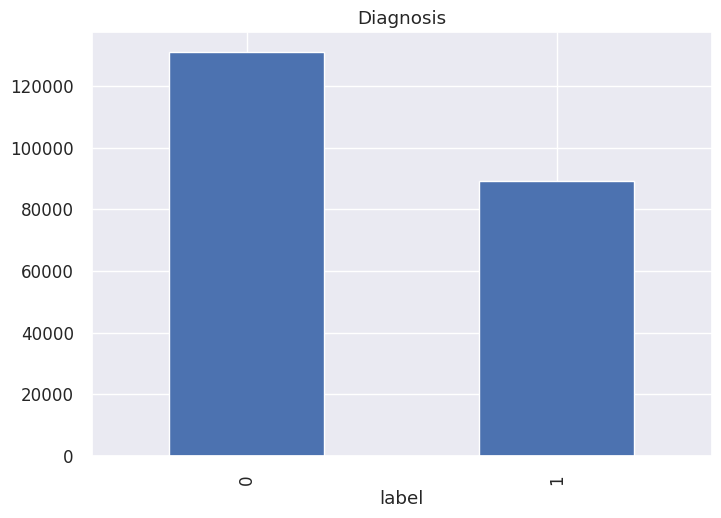

Found 0 after shuffling
(154017,) (154017,) (52806,) (52806,) (13202,) (13202,)


In [11]:
# define our datasets
# Load data
(X_train_paths, y_train, train_ids), (X_val_paths, y_val, val_ids), (X_test_paths, y_test, test_ids) = get_data()

train_dataset = HistoDataset(X_train_paths, y_train, train_ids, xforms['train'])
eval_dataset = HistoDataset(X_val_paths, y_val, val_ids, xforms['eval'])
test_dataset = HistoDataset(X_test_paths, y_test, test_ids, xforms['test'])

Dataset: image.shape = torch.Size([64, 3, 96, 96]), labels.shape = torch.Size([64])


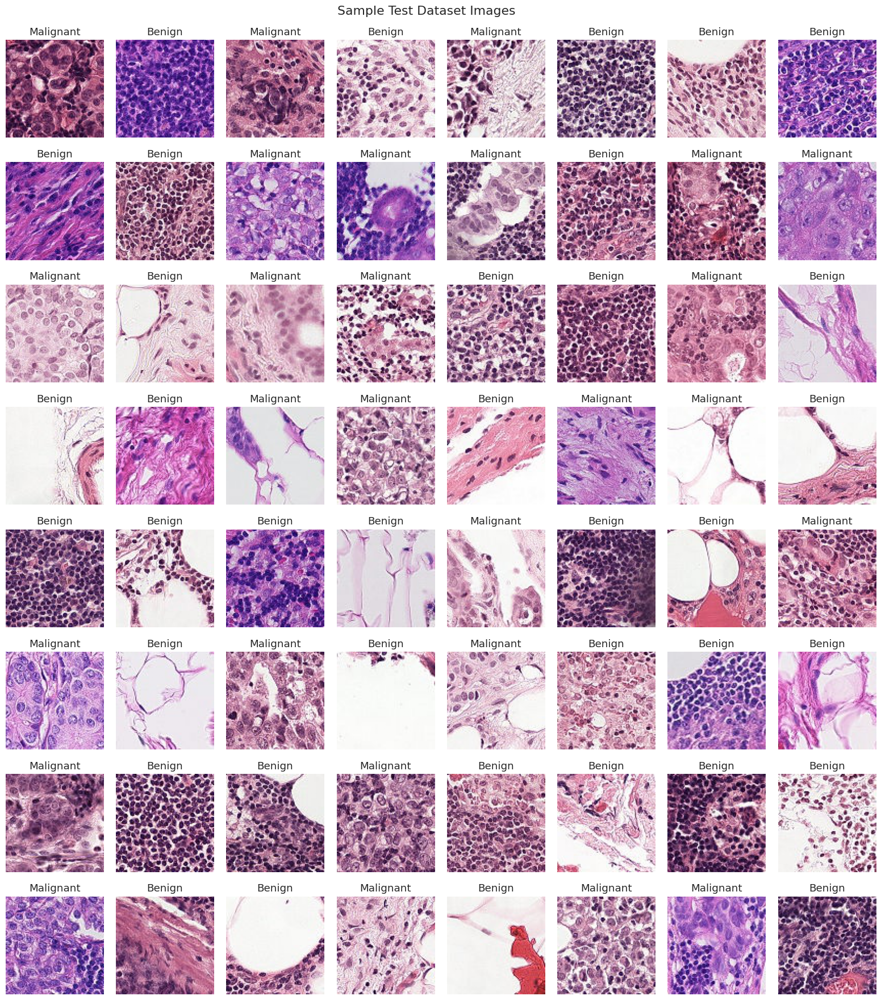

In [12]:
# let's view a sample of 64 images from the test dataset
loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)
data_iter = iter(loader)
sample_images, sample_labels, _ = next(data_iter)  # fetch first batch of 64 images & labels
print(f'Dataset: image.shape = {sample_images.shape}, labels.shape = {sample_labels.shape}')
display_sample(sample_images.cpu().numpy(), sample_labels.cpu().numpy(), plot_title="Sample Test Dataset Images");     

### Hyperparameters

In [13]:
IMAGE_WIDTH, IMAGE_HEIGHT, NUM_CHANNELS, NUM_CLASSES = 96, 96, 3, 2
#NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 2, 256, 3e-3, 0.0075
NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 100, 128, 3e-3, 0.0075

# Building Model

In [14]:
def build_model():
    net = nn.Sequential(
        nn.Conv2d(NUM_CHANNELS, 8, 3, padding=1),
        nn.ReLU(),
        nn.BatchNorm2d(8),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(8, 16, 3, padding=1),
        nn.ReLU(),
        nn.BatchNorm2d(16),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(16, 32, 3, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(32),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(32, 64, 3, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(64),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Flatten(),
        
        nn.Linear(64*4*4, 512),
        nn.ReLU(),
        nn.Dropout(0.25),
        
        nn.Linear(512, NUM_CLASSES),
        nn.LogSoftmax(dim=1)
    )
    model = net
    class_counts = [num_benign, num_malignant]
    weights = torch.FloatTensor(class_counts) / (num_benign + num_malignant)
    weights = weights.cuda() if torch.cuda.is_available() else weights.cpu()

    # since data is imbalanced, we need to apply weights to the loss function
    criterion = nn.CrossEntropyLoss(weight=weights, reduction='sum')
    #criterion = nn.NLLLoss(weight=weights, reduction='sum')
    optimizer = optim.Adam(params=model.parameters(), lr=LR_RATE, weight_decay=L2_REG)

    return model, criterion, optimizer

In [15]:
model, criterion, optimizer = build_model()

from torchinfo import summary
print(summary(model, input_size=(1, NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH))) # for batch_size = 1

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 2]                    --
├─Conv2d: 1-1                            [1, 8, 96, 96]            224
├─ReLU: 1-2                              [1, 8, 96, 96]            --
├─BatchNorm2d: 1-3                       [1, 8, 96, 96]            16
├─MaxPool2d: 1-4                         [1, 8, 48, 48]            --
├─Conv2d: 1-5                            [1, 16, 48, 48]           1,168
├─ReLU: 1-6                              [1, 16, 48, 48]           --
├─BatchNorm2d: 1-7                       [1, 16, 48, 48]           32
├─MaxPool2d: 1-8                         [1, 16, 24, 24]           --
├─Conv2d: 1-9                            [1, 32, 22, 22]           4,640
├─ReLU: 1-10                             [1, 32, 22, 22]           --
├─BatchNorm2d: 1-11                      [1, 32, 22, 22]           64
├─MaxPool2d: 1-12                        [1, 32, 11, 11]           --
├─Conv2d

In [16]:
from tqdm import tqdm
#from sklearn.metrics import classification_report

history = {
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': []
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs):
    #device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print('-' * 20)

        # Training Phase
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0

        for inputs, labels, _ in tqdm(train_loader):
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / train_total
        epoch_train_acc = train_correct / train_total
        print(f"Train Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")

        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for inputs, labels, _ in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        epoch_val_loss = val_loss / val_total
        epoch_val_acc = val_correct / val_total
        print(f"Val Loss: {epoch_val_loss:.4f} | Val Acc: {epoch_val_acc:.4f}")

        # Log history
        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        # Learning Rate Scheduler Step

        if scheduler:
            scheduler.step(epoch_val_loss)

    return model, history

In [17]:
# Check the CPU count
import os
print(f"Kaggle CPU Count: {os.cpu_count()}")
num_workers = os.cpu_count()

Kaggle CPU Count: 4


In [18]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(eval_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

In [19]:
# apply a learning rate scheduler
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR

# allocating model, loss function, and optimizer
model, criterion, optimizer = build_model()
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=1)
#lr_scheduler = StepLR(optimizer, step_size=NUM_EPOCHS//5, gamma=0.5, verbose=1)

# training model
model, history = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    num_epochs=NUM_EPOCHS    
)

Epoch 1/100
--------------------


100%|██████████| 1204/1204 [07:19<00:00,  2.74it/s]

Train Loss: 24.3357 | Train Acc: 0.8278


Val Loss: 31.7553 | Val Acc: 0.7386
Epoch 2/100
--------------------


100%|██████████| 1204/1204 [02:21<00:00,  8.54it/s]

Train Loss: 20.2657 | Train Acc: 0.8585


Val Loss: 76.3457 | Val Acc: 0.7244
Epoch 3/100
--------------------


100%|██████████| 1204/1204 [02:15<00:00,  8.89it/s]

Train Loss: 18.2790 | Train Acc: 0.8753


Val Loss: 26.4476 | Val Acc: 0.8375
Epoch 4/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.97it/s]

Train Loss: 17.2490 | Train Acc: 0.8837


Val Loss: 17.7063 | Val Acc: 0.8698
Epoch 5/100
--------------------


100%|██████████| 1204/1204 [02:16<00:00,  8.85it/s]

Train Loss: 16.6839 | Train Acc: 0.8873


Val Loss: 27.6306 | Val Acc: 0.8112
Epoch 6/100
--------------------


100%|██████████| 1204/1204 [02:22<00:00,  8.48it/s]

Train Loss: 16.3458 | Train Acc: 0.8911


Val Loss: 37.0520 | Val Acc: 0.7753
Epoch 7/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.00it/s]

Train Loss: 15.9950 | Train Acc: 0.8932


Val Loss: 19.9074 | Val Acc: 0.8651
Epoch 8/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.96it/s]

Train Loss: 15.8724 | Train Acc: 0.8950


Val Loss: 36.4488 | Val Acc: 0.7898
Epoch 9/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.04it/s]

Train Loss: 15.6687 | Train Acc: 0.8965


Val Loss: 19.6306 | Val Acc: 0.8702
Epoch 10/100
--------------------


100%|██████████| 1204/1204 [02:10<00:00,  9.22it/s]

Train Loss: 15.4925 | Train Acc: 0.8974


Val Loss: 25.6504 | Val Acc: 0.8327
Epoch 11/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.27it/s]

Train Loss: 14.4083 | Train Acc: 0.9048


Val Loss: 30.0018 | Val Acc: 0.8020
Epoch 12/100
--------------------


100%|██████████| 1204/1204 [02:18<00:00,  8.67it/s]

Train Loss: 14.1618 | Train Acc: 0.9081


Val Loss: 15.4060 | Val Acc: 0.8888
Epoch 13/100
--------------------


100%|██████████| 1204/1204 [02:10<00:00,  9.26it/s]

Train Loss: 14.1200 | Train Acc: 0.9071


Val Loss: 16.9800 | Val Acc: 0.8820
Epoch 14/100
--------------------


100%|██████████| 1204/1204 [02:10<00:00,  9.22it/s]

Train Loss: 13.9039 | Train Acc: 0.9091


Val Loss: 15.8144 | Val Acc: 0.8978
Epoch 15/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.18it/s]

Train Loss: 13.8561 | Train Acc: 0.9093


Val Loss: 16.1217 | Val Acc: 0.8891
Epoch 16/100
--------------------


100%|██████████| 1204/1204 [02:19<00:00,  8.66it/s]

Train Loss: 13.7895 | Train Acc: 0.9101


Val Loss: 21.8144 | Val Acc: 0.8528
Epoch 17/100
--------------------


100%|██████████| 1204/1204 [02:17<00:00,  8.75it/s]

Train Loss: 13.7388 | Train Acc: 0.9107


Val Loss: 14.0132 | Val Acc: 0.9015
Epoch 18/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.96it/s]

Train Loss: 13.7632 | Train Acc: 0.9102


Val Loss: 13.3961 | Val Acc: 0.9113
Epoch 19/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.03it/s]

Train Loss: 13.6472 | Train Acc: 0.9113


Val Loss: 22.7324 | Val Acc: 0.8385
Epoch 20/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.92it/s]

Train Loss: 13.5687 | Train Acc: 0.9120


Val Loss: 23.0623 | Val Acc: 0.8338
Epoch 21/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.04it/s]

Train Loss: 13.5191 | Train Acc: 0.9126


Val Loss: 15.5543 | Val Acc: 0.8952
Epoch 22/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.06it/s]

Train Loss: 13.4652 | Train Acc: 0.9122


Val Loss: 16.5324 | Val Acc: 0.8747
Epoch 23/100
--------------------


100%|██████████| 1204/1204 [02:17<00:00,  8.77it/s]

Train Loss: 13.4767 | Train Acc: 0.9124


Val Loss: 15.3435 | Val Acc: 0.8916
Epoch 24/100
--------------------


100%|██████████| 1204/1204 [02:16<00:00,  8.80it/s]

Train Loss: 13.4369 | Train Acc: 0.9124


Val Loss: 14.1191 | Val Acc: 0.9096
Epoch 25/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.94it/s]

Train Loss: 12.7500 | Train Acc: 0.9174


Val Loss: 14.6684 | Val Acc: 0.8941
Epoch 26/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.96it/s]

Train Loss: 12.6675 | Train Acc: 0.9186


Val Loss: 14.2613 | Val Acc: 0.8988
Epoch 27/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.08it/s]

Train Loss: 12.5655 | Train Acc: 0.9189


Val Loss: 14.2627 | Val Acc: 0.9028
Epoch 28/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.04it/s]

Train Loss: 12.5818 | Train Acc: 0.9188


Val Loss: 14.3118 | Val Acc: 0.9061
Epoch 29/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.02it/s]

Train Loss: 12.4889 | Train Acc: 0.9195


Val Loss: 14.8270 | Val Acc: 0.8928
Epoch 30/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.02it/s]

Train Loss: 12.5194 | Train Acc: 0.9194


Val Loss: 28.5831 | Val Acc: 0.8094
Epoch 31/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.04it/s]

Train Loss: 12.0310 | Train Acc: 0.9221


Val Loss: 12.5760 | Val Acc: 0.9191
Epoch 32/100
--------------------


100%|██████████| 1204/1204 [02:08<00:00,  9.40it/s]

Train Loss: 12.0294 | Train Acc: 0.9226


Val Loss: 12.8104 | Val Acc: 0.9119
Epoch 33/100
--------------------


100%|██████████| 1204/1204 [02:08<00:00,  9.36it/s]

Train Loss: 11.9756 | Train Acc: 0.9223


Val Loss: 13.6256 | Val Acc: 0.9075
Epoch 34/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.18it/s]

Train Loss: 11.9417 | Train Acc: 0.9230


Val Loss: 13.9962 | Val Acc: 0.9013
Epoch 35/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.28it/s]

Train Loss: 11.8637 | Train Acc: 0.9237


Val Loss: 12.9620 | Val Acc: 0.9105
Epoch 36/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.30it/s]

Train Loss: 11.9123 | Train Acc: 0.9232


Val Loss: 16.1343 | Val Acc: 0.8823
Epoch 37/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.12it/s]

Train Loss: 11.8254 | Train Acc: 0.9243


Val Loss: 12.0798 | Val Acc: 0.9199
Epoch 38/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.02it/s]

Train Loss: 11.7850 | Train Acc: 0.9240


Val Loss: 12.7686 | Val Acc: 0.9146
Epoch 39/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.97it/s]

Train Loss: 11.8169 | Train Acc: 0.9239


Val Loss: 13.9997 | Val Acc: 0.8992
Epoch 40/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.07it/s]

Train Loss: 11.7750 | Train Acc: 0.9245


Val Loss: 11.9788 | Val Acc: 0.9196
Epoch 41/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.01it/s]

Train Loss: 11.7611 | Train Acc: 0.9240


Val Loss: 13.3778 | Val Acc: 0.9055
Epoch 42/100
--------------------


100%|██████████| 1204/1204 [02:16<00:00,  8.82it/s]

Train Loss: 11.6726 | Train Acc: 0.9249


Val Loss: 14.1094 | Val Acc: 0.9012
Epoch 43/100
--------------------


100%|██████████| 1204/1204 [02:15<00:00,  8.86it/s]

Train Loss: 11.7072 | Train Acc: 0.9246


Val Loss: 12.6223 | Val Acc: 0.9137
Epoch 44/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.95it/s]

Train Loss: 11.6536 | Train Acc: 0.9253


Val Loss: 16.1515 | Val Acc: 0.8948
Epoch 45/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  8.99it/s]

Train Loss: 11.7213 | Train Acc: 0.9246


Val Loss: 13.6352 | Val Acc: 0.9125
Epoch 46/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.98it/s]

Train Loss: 11.6177 | Train Acc: 0.9251


Val Loss: 11.6276 | Val Acc: 0.9228
Epoch 47/100
--------------------


100%|██████████| 1204/1204 [02:15<00:00,  8.89it/s]

Train Loss: 11.5627 | Train Acc: 0.9264


Val Loss: 13.3594 | Val Acc: 0.9058
Epoch 48/100
--------------------


100%|██████████| 1204/1204 [02:16<00:00,  8.79it/s]

Train Loss: 11.7141 | Train Acc: 0.9254


Val Loss: 12.1005 | Val Acc: 0.9206
Epoch 49/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.96it/s]

Train Loss: 11.6648 | Train Acc: 0.9251


Val Loss: 12.4061 | Val Acc: 0.9151
Epoch 50/100
--------------------


100%|██████████| 1204/1204 [02:15<00:00,  8.88it/s]

Train Loss: 11.6009 | Train Acc: 0.9259


Val Loss: 12.3836 | Val Acc: 0.9196
Epoch 51/100
--------------------


100%|██████████| 1204/1204 [02:17<00:00,  8.77it/s]

Train Loss: 11.5843 | Train Acc: 0.9252


Val Loss: 14.3629 | Val Acc: 0.8976
Epoch 52/100
--------------------


100%|██████████| 1204/1204 [02:15<00:00,  8.89it/s]

Train Loss: 11.6060 | Train Acc: 0.9252


Val Loss: 15.6662 | Val Acc: 0.8858
Epoch 53/100
--------------------


100%|██████████| 1204/1204 [02:16<00:00,  8.83it/s]

Train Loss: 11.2543 | Train Acc: 0.9278


Val Loss: 11.4864 | Val Acc: 0.9237
Epoch 54/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.98it/s]

Train Loss: 11.2228 | Train Acc: 0.9281


Val Loss: 11.9160 | Val Acc: 0.9196
Epoch 55/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.16it/s]

Train Loss: 11.1518 | Train Acc: 0.9290


Val Loss: 11.8803 | Val Acc: 0.9215
Epoch 56/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.11it/s]

Train Loss: 11.3010 | Train Acc: 0.9271


Val Loss: 12.0838 | Val Acc: 0.9212
Epoch 57/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.98it/s]

Train Loss: 11.2230 | Train Acc: 0.9285


Val Loss: 12.3140 | Val Acc: 0.9157
Epoch 58/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.15it/s]

Train Loss: 11.1659 | Train Acc: 0.9286


Val Loss: 12.0435 | Val Acc: 0.9210
Epoch 59/100
--------------------


100%|██████████| 1204/1204 [02:15<00:00,  8.86it/s]

Train Loss: 11.1479 | Train Acc: 0.9287


Val Loss: 11.4498 | Val Acc: 0.9252
Epoch 60/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.93it/s]

Train Loss: 11.1310 | Train Acc: 0.9290


Val Loss: 11.0369 | Val Acc: 0.9291
Epoch 61/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.01it/s]

Train Loss: 11.1417 | Train Acc: 0.9283


Val Loss: 11.2511 | Val Acc: 0.9274
Epoch 62/100
--------------------


100%|██████████| 1204/1204 [02:15<00:00,  8.90it/s]

Train Loss: 11.0673 | Train Acc: 0.9291


Val Loss: 11.1736 | Val Acc: 0.9283
Epoch 63/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  8.99it/s]

Train Loss: 11.1325 | Train Acc: 0.9289


Val Loss: 12.4380 | Val Acc: 0.9146
Epoch 64/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.10it/s]

Train Loss: 11.1154 | Train Acc: 0.9285


Val Loss: 11.9290 | Val Acc: 0.9206
Epoch 65/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.06it/s]

Train Loss: 11.1118 | Train Acc: 0.9280


Val Loss: 11.5273 | Val Acc: 0.9230
Epoch 66/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.09it/s]

Train Loss: 11.0421 | Train Acc: 0.9296


Val Loss: 11.4204 | Val Acc: 0.9262
Epoch 67/100
--------------------


100%|██████████| 1204/1204 [02:19<00:00,  8.66it/s]

Train Loss: 10.9879 | Train Acc: 0.9301


Val Loss: 11.7977 | Val Acc: 0.9189
Epoch 68/100
--------------------


100%|██████████| 1204/1204 [02:16<00:00,  8.84it/s]

Train Loss: 10.8694 | Train Acc: 0.9306


Val Loss: 11.1551 | Val Acc: 0.9275
Epoch 69/100
--------------------


100%|██████████| 1204/1204 [02:13<00:00,  9.04it/s]

Train Loss: 10.9230 | Train Acc: 0.9302


Val Loss: 11.2482 | Val Acc: 0.9264
Epoch 70/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.09it/s]

Train Loss: 10.8384 | Train Acc: 0.9307


Val Loss: 11.0719 | Val Acc: 0.9274
Epoch 71/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.07it/s]

Train Loss: 10.8786 | Train Acc: 0.9304


Val Loss: 11.5302 | Val Acc: 0.9230
Epoch 72/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.11it/s]

Train Loss: 10.8138 | Train Acc: 0.9303


Val Loss: 11.2367 | Val Acc: 0.9256
Epoch 73/100
--------------------


100%|██████████| 1204/1204 [02:17<00:00,  8.77it/s]

Train Loss: 10.7925 | Train Acc: 0.9312


Val Loss: 11.1138 | Val Acc: 0.9266
Epoch 74/100
--------------------


100%|██████████| 1204/1204 [02:14<00:00,  8.96it/s]

Train Loss: 10.7242 | Train Acc: 0.9311


Val Loss: 11.4032 | Val Acc: 0.9244
Epoch 75/100
--------------------


100%|██████████| 1204/1204 [02:17<00:00,  8.73it/s]

Train Loss: 10.7845 | Train Acc: 0.9312


Val Loss: 11.3236 | Val Acc: 0.9259
Epoch 76/100
--------------------


100%|██████████| 1204/1204 [02:16<00:00,  8.84it/s]

Train Loss: 10.6894 | Train Acc: 0.9316


Val Loss: 11.1682 | Val Acc: 0.9267
Epoch 77/100
--------------------


100%|██████████| 1204/1204 [02:17<00:00,  8.78it/s]

Train Loss: 10.7077 | Train Acc: 0.9315


Val Loss: 11.1622 | Val Acc: 0.9257
Epoch 78/100
--------------------


100%|██████████| 1204/1204 [02:12<00:00,  9.07it/s]

Train Loss: 10.6854 | Train Acc: 0.9320


Val Loss: 10.9513 | Val Acc: 0.9278
Epoch 79/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.17it/s]

Train Loss: 10.6902 | Train Acc: 0.9319


Val Loss: 11.0446 | Val Acc: 0.9265
Epoch 80/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.14it/s]

Train Loss: 10.6959 | Train Acc: 0.9311


Val Loss: 11.0617 | Val Acc: 0.9262
Epoch 81/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.31it/s]

Train Loss: 10.7065 | Train Acc: 0.9315


Val Loss: 11.0862 | Val Acc: 0.9262
Epoch 82/100
--------------------


100%|██████████| 1204/1204 [02:10<00:00,  9.26it/s]

Train Loss: 10.6570 | Train Acc: 0.9313


Val Loss: 10.9335 | Val Acc: 0.9278
Epoch 83/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.19it/s]

Train Loss: 10.5835 | Train Acc: 0.9322


Val Loss: 11.1596 | Val Acc: 0.9258
Epoch 84/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.27it/s]

Train Loss: 10.6557 | Train Acc: 0.9324


Val Loss: 11.1752 | Val Acc: 0.9277
Epoch 85/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.14it/s]

Train Loss: 10.6522 | Train Acc: 0.9313


Val Loss: 11.3466 | Val Acc: 0.9232
Epoch 86/100
--------------------


100%|██████████| 1204/1204 [02:10<00:00,  9.25it/s]

Train Loss: 10.6491 | Train Acc: 0.9320


Val Loss: 11.6747 | Val Acc: 0.9206
Epoch 87/100
--------------------


100%|██████████| 1204/1204 [02:08<00:00,  9.38it/s]

Train Loss: 10.7176 | Train Acc: 0.9312


Val Loss: 11.2820 | Val Acc: 0.9266
Epoch 88/100
--------------------


100%|██████████| 1204/1204 [02:08<00:00,  9.34it/s]

Train Loss: 10.6888 | Train Acc: 0.9316


Val Loss: 10.9819 | Val Acc: 0.9279
Epoch 89/100
--------------------


100%|██████████| 1204/1204 [02:07<00:00,  9.42it/s]

Train Loss: 10.6468 | Train Acc: 0.9322


Val Loss: 11.3210 | Val Acc: 0.9239
Epoch 90/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.33it/s]

Train Loss: 10.6140 | Train Acc: 0.9323


Val Loss: 11.2610 | Val Acc: 0.9245
Epoch 91/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.33it/s]

Train Loss: 10.5391 | Train Acc: 0.9323


Val Loss: 11.1038 | Val Acc: 0.9262
Epoch 92/100
--------------------


100%|██████████| 1204/1204 [02:11<00:00,  9.12it/s]

Train Loss: 10.5558 | Train Acc: 0.9322


Val Loss: 10.8848 | Val Acc: 0.9290
Epoch 93/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.29it/s]

Train Loss: 10.5472 | Train Acc: 0.9325


Val Loss: 11.2241 | Val Acc: 0.9245
Epoch 94/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.32it/s]

Train Loss: 10.5765 | Train Acc: 0.9318


Val Loss: 11.0521 | Val Acc: 0.9266
Epoch 95/100
--------------------


100%|██████████| 1204/1204 [02:10<00:00,  9.22it/s]

Train Loss: 10.6282 | Train Acc: 0.9322


Val Loss: 10.9289 | Val Acc: 0.9285
Epoch 96/100
--------------------


100%|██████████| 1204/1204 [02:08<00:00,  9.35it/s]

Train Loss: 10.5722 | Train Acc: 0.9330


Val Loss: 11.2412 | Val Acc: 0.9245
Epoch 97/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.27it/s]

Train Loss: 10.5823 | Train Acc: 0.9326


Val Loss: 10.7994 | Val Acc: 0.9278
Epoch 98/100
--------------------


100%|██████████| 1204/1204 [02:09<00:00,  9.28it/s]

Train Loss: 10.5833 | Train Acc: 0.9321


Val Loss: 11.3828 | Val Acc: 0.9231
Epoch 99/100
--------------------


100%|██████████| 1204/1204 [02:06<00:00,  9.53it/s]

Train Loss: 10.5724 | Train Acc: 0.9324


Val Loss: 11.0965 | Val Acc: 0.9253
Epoch 100/100
--------------------


100%|██████████| 1204/1204 [02:07<00:00,  9.44it/s]

Train Loss: 10.4466 | Train Acc: 0.9337


Val Loss: 10.7457 | Val Acc: 0.9291


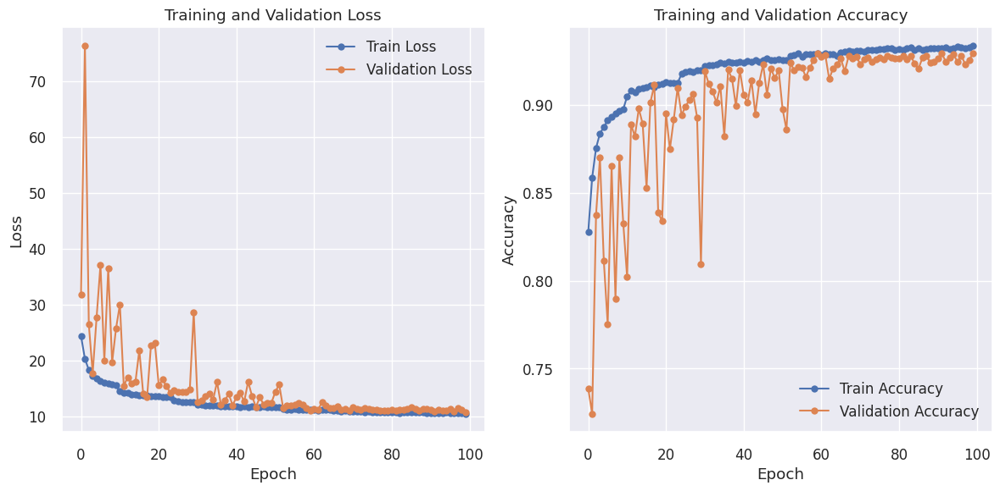

In [20]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    # Loss plot
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss', marker='o')
    plt.plot(history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Accuracy Plot
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy', marker='o')
    plt.plot(history['val_acc'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Show the plots
    plt.tight_layout()
    plt.show()

plot_training_history(history)

In [21]:
def evaluate_model(model, dataloader, criterion):
    model.to(device)
    model.eval() # set the model in 'evaluation mode'

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    with torch.no_grad(): # disable gradient updates 
        for inputs, labels, _ in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)

            # prediction 
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # acummulate loss            
            total_loss += loss.item() * inputs.size(0)

            # count the number of correct
            _, preds = torch.max(outputs, 1)
            total_correct += (preds == labels).sum().item()
            total_samples += labels.size(0)

    # calculate average loss and accuracy
    avg_loss = total_loss / total_samples
    avg_acc = total_correct / total_samples
    return avg_loss, avg_acc

# evaluate on each dataset
train_loss, train_acc = evaluate_model(model, train_loader, criterion)
print(f'Training data -> loss: {train_loss:.3f}, acc: {train_acc:.3f}')

eval_loss, eval_acc = evaluate_model(model, val_loader, criterion)
print(f'Cross-val data -> loss: {eval_loss:.3f}, acc: {eval_acc:.3f}')

#test_loss, test_acc = evaluate_model(model, test_loader, criterion)
#print(f'Testing data -> loss: {test_loss:.3f}, acc: {test_acc:.3f}')

Training data -> loss: 9.661, acc: 0.939
Cross-val data -> loss: 10.746, acc: 0.929


In [22]:
# save the trained model
# batch_size = 2のmodel
torch.save(model.state_dict(),"/kaggle/working/model.pth")

# release the GPU memory by deleting the model object
del model
torch.cuda.empty_cache()  # release cache on the GPU

## Running Prediction

In [23]:
# To reload the trained model;
# initialize the model (with initial weights and biases)
model, criterion, optimizer = build_model()
# load the weights and biases into the model
model.load_state_dict(torch.load("/kaggle/working/model.pth"))
model.to(device)

from torchinfo import summary
print(summary(model, input_size=(1, NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH))) # for batch_size = 1

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 2]                    --
├─Conv2d: 1-1                            [1, 8, 96, 96]            224
├─ReLU: 1-2                              [1, 8, 96, 96]            --
├─BatchNorm2d: 1-3                       [1, 8, 96, 96]            16
├─MaxPool2d: 1-4                         [1, 8, 48, 48]            --
├─Conv2d: 1-5                            [1, 16, 48, 48]           1,168
├─ReLU: 1-6                              [1, 16, 48, 48]           --
├─BatchNorm2d: 1-7                       [1, 16, 48, 48]           32
├─MaxPool2d: 1-8                         [1, 16, 24, 24]           --
├─Conv2d: 1-9                            [1, 32, 22, 22]           4,640
├─ReLU: 1-10                             [1, 32, 22, 22]           --
├─BatchNorm2d: 1-11                      [1, 32, 22, 22]           64
├─MaxPool2d: 1-12                        [1, 32, 11, 11]           --
├─Conv2d

In [24]:
# Display sample from test dataset
print(f'Running predictions on {len(test_dataset)} test records...')

#test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
actuals, predictions = [], []

# Ensure model is in evaluation mode
model.eval()

with torch.no_grad(): # Disable gradient computation for inference
    for batch_no, (images, labels, _) in enumerate(test_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Get predictions
        outputs = model(images) # Forward pass
        preds = torch.argmax(outputs, dim=1) # Get class indices

        actuals.extend(labels.cpu().numpy().ravel())
        predictions.extend(preds.cpu().numpy().ravel())

# Convert lists to numpy arrays
actuals = np.array(actuals)
predictinos = np.array(predictions)

print('Sample actual values & predictions...')
print('  - Actual values: ', actuals[:32])
print('  - Precictions  : ', predictions[:32])

# Calculate accuracy
correct_preds = (actuals == predictions).sum()
acc = correct_preds / len(actuals)
print(f'  We got {correct_preds} of {len(actuals)} correct ({acc:.3f} accuracy)')

# Display classification report and confusion matrix
print(classification_report(actuals, predictions))
print('Confusion Matrix:')
print(confusion_matrix(actuals, predictions))

Running predictions on 13202 test records...
Sample actual values & predictions...
  - Actual values:  [1 0 1 0 1 0 0 0 0 0 1 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 1 1 0]
  - Precictions  :  [1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0]
  We got 12257 of 13202 correct (0.928 accuracy)
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      7855
           1       0.96      0.86      0.91      5347

    accuracy                           0.93     13202
   macro avg       0.93      0.92      0.92     13202
weighted avg       0.93      0.93      0.93     13202

Confusion Matrix:
[[7656  199]
 [ 746 4601]]


In [25]:
# Ensure model is in evaluation mode
model.eval()

# Store predictions
predictions = []
image_ids = [] 

#test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Generate predictions
with torch.no_grad():
    for batch_no, (images, labels, ids) in enumerate(test_loader):
        images = images.to(device)

        # Get predictions
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        # Append results
        predictions.extend(preds.cpu().numpy())
        #print('appending ids', ids)
        image_ids.extend(ids)  # Ensure test dataset returns IDs for images

# Create a submission DataFrame
submission = pd.DataFrame({
    'id': image_ids,
    'label': predictions
})

# Save to CSV
submission.to_csv('submission.csv', index=False)
print("Submission file created: submission.csv")

Submission file created: submission.csv


In [26]:
import pandas as pd
true_sub = pd.read_csv('/kaggle/working/submission.csv')
true_sub[:10]

,id,label
0,7743487e60d261d1048169be1436e2a18ba6dd19,1
1,029020b11b4ca9d3a3d7fbfa92eebab4d618ebe6,0
2,e730f0d3f70d82130afb47c1c7c7c14c489dc5ad,1
3,8753d8eb6b828259857549fe7f1684aee3cad595,0
4,1732b4d9a0ad3182e9a27864592c8532043f5a6e,1
5,c6e470c27721e87ae849a8ddadf20ed3873c7502,0
6,9609dd01605b76338b6c6ed086a838ebdeb8a4d3,0
7,30ac2934ace8723c848711150f52d05e27821259,0
8,0c2cc836438bc447f3a10b869832756a4f4390cf,0
9,78386e3d76762746c18efe4743785467d2a1382f,0


torch.Size([64, 3, 96, 96]) torch.Size([64]) (64,)


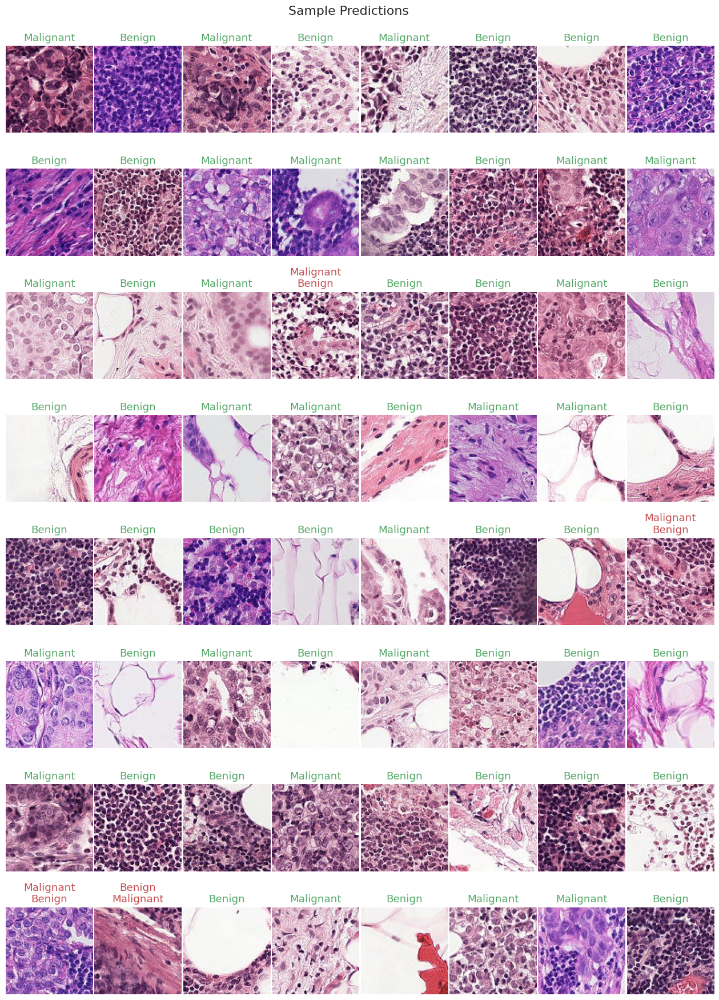

In [27]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)
data_iter = iter(test_loader)

images, labels, _ = next(data_iter)

# model prediction
images = images.to(device) 
preds = model(images)
preds = torch.argmax(preds, dim=1).cpu().numpy()

# print the result
print(images.shape, labels.shape, preds.shape)

# plot the sample
display_sample(images.cpu().numpy(), labels.cpu().numpy(), sample_predictions=preds,
               grid_shape=(8, 8), fig_size=(16, 20), plot_title='Sample Predictions')

In [28]:
del model